# Filtracja Obrazu
+ AUTOR: **Łukasz Staniszewski**
+ JĘZYK PROGRAMOWANIA: **Python**
+ ŚRODOWISKO TWORZENIA: **Google Colab**
+ TEMAT: **Filtracja obrazów cyfrowych przy użyciu biblioteki OpenCV**

## 1. Import niezbędnych modułów:
+ **cv2** - moduł OpenCV, realizuje operacje na obrazie cyfrowym,
+ **pandas** - tworzenie tabel,
+ **matplotlib.pyplot** - tworzenie wykresów,
+ **numpy** - operacje macierzowe.

In [2]:
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

## 2. Pobranie obrazów
W tym punkcie nastąpiło pobranie niezbędnych plików .png do realizacji zadania.
Koniecznym było pobranie plików:
+ **boat2_col.png** - obraz oryginalny ($6$),
+ **boat2_col_noise.png** - obraz zaszumiony szumem gaussowskim,
+ **boat2_col_inoise.png** - obraz zaszumiony szumem impulsowym.


In [3]:
data_dir = "/content/"
imageGauss = cv2.imread("img/boat2_col_noise.png", cv2.IMREAD_UNCHANGED)
imageImp = cv2.imread("img/boat2_col_inoise.png", cv2.IMREAD_UNCHANGED)
imageOrig = cv2.imread("img/boat2_col.png", cv2.IMREAD_UNCHANGED)

## 3. Zadanie 1. - realizacja operacji filtracji barwnego obrazu cyfrowego
+ Na początku zostało przeprowadzone przetwarzanie obrazów zaszumionych filtrem Gaussa oraz medianowym, następnie przypisanie wyników operacji do zmiennych.
+ Dodatkowo powstała specjalna funkcja: **calcPSNR**, która, przyjmując obraz oryginalny oraz obraz przefiltrowany, oblicza szczytowy stosunek sygnału do szumu.


In [4]:
def calcPSNR(imgOriginal, imgFiltered):
  """Function counts PSNR between original image, and image filtered.

  Args:
      imgOriginal (numpy.ndarray): image original
      imgFiltered (numpy.ndarray): image after filtering

  Returns:
      int: psnr value
  """
  imax = 255.**2            # max pixel value is 255
  # converting to float in order to get negative values
  mse = ((imgOriginal.astype(np.float64) - imgFiltered)**2).sum() / imgOriginal.size
  return 10.0 * np.log10(imax / mse)

# (3, 3) in cv2.GaussianBlur means 3x3 mask, 0 is telling program to choose by himself deviation
imageGaussGB3 = cv2.GaussianBlur(imageGauss, (3, 3), 0)
imageGaussGB5 = cv2.GaussianBlur(imageGauss, (5, 5), 0)
imageGaussGB7 = cv2.GaussianBlur(imageGauss, (7, 7), 0)
imageImpGB3 = cv2.GaussianBlur(imageImp, (3, 3), 0)
imageImpGB5 = cv2.GaussianBlur(imageImp, (5, 5), 0)
imageImpGB7 = cv2.GaussianBlur(imageImp, (7, 7), 0)
# 3 means 3x3 mask
imageGaussMed3 = cv2.medianBlur(imageGauss, 3)
imageGaussMed5 = cv2.medianBlur(imageGauss, 5)
imageGaussMed7 = cv2.medianBlur(imageGauss, 7)
imageImpMed3 = cv2.medianBlur(imageImp, 3)
imageImpMed5 = cv2.medianBlur(imageImp, 5)
imageImpMed7 = cv2.medianBlur(imageImp, 7)


+ Nastepnym konieczne było policzenie PSNR po operacjach wygładzania dla każdego z obrazów wejściowych, filtrów oraz masek i zestawienie wyników w formie tabelarycznej.

In [5]:
# dictionary of PSNR'S
d = {
    'IMAGE': ["Image with gaussian blur", "Image with impulsive blur"],
    'GAUSSIAN FILTR 3x3': [calcPSNR(imageOrig, imageGaussGB3), calcPSNR(imageOrig, imageImpGB3)],
    'GAUSSIAN FILTR 5x5': [calcPSNR(imageOrig, imageGaussGB5), calcPSNR(imageOrig, imageImpGB5)],
    'GAUSSIAN FILTR 7x7': [calcPSNR(imageOrig, imageGaussGB7), calcPSNR(imageOrig, imageImpGB7)],
    'MEDIAN FILTR 3x3': [calcPSNR(imageOrig, imageGaussMed3), calcPSNR(imageOrig, imageImpMed3)],
    'MEDIAN FILTR 5x5': [calcPSNR(imageOrig, imageGaussMed5), calcPSNR(imageOrig, imageImpMed5)],
    'MEDIAN FILTR 7x7': [calcPSNR(imageOrig, imageGaussMed7), calcPSNR(imageOrig, imageImpMed7)],
}
# making dictionary a dataframe
df = pd.DataFrame(d)
df.set_index("IMAGE")
df

,IMAGE,GAUSSIAN FILTR 3x3,GAUSSIAN FILTR 5x5,GAUSSIAN FILTR 7x7,MEDIAN FILTR 3x3,MEDIAN FILTR 5x5,MEDIAN FILTR 7x7
0,Image with gaussian blur,29.191400,27.823497,26.527572,27.878431,25.845159,24.985125
1,Image with impulsive blur,26.865252,26.700751,25.982801,29.393936,26.190111,25.164699



+ Dodatkowo wyświetlone zostały kolejne obrazy jako wyniki działań.

**UWAGA - W PRZYPADKU CHĘCI OBEJRZENIA OBRAZKA W WIĘKSZEJ ROZDZIELCZOŚCI, WYSTARCZY NA NIEGO NACISNĄĆ.**

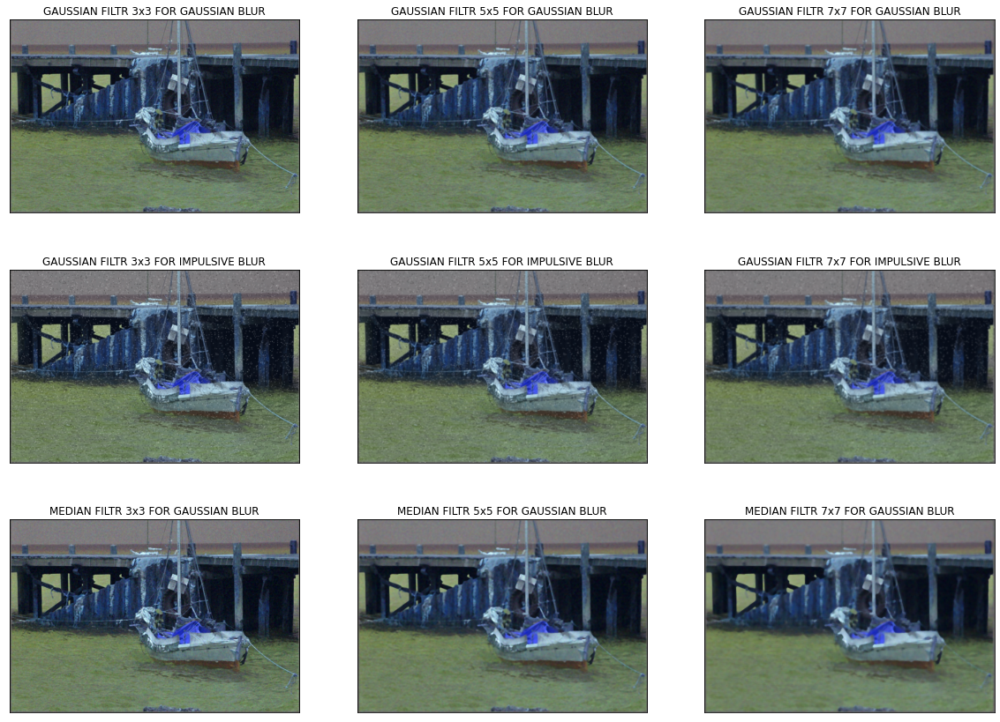

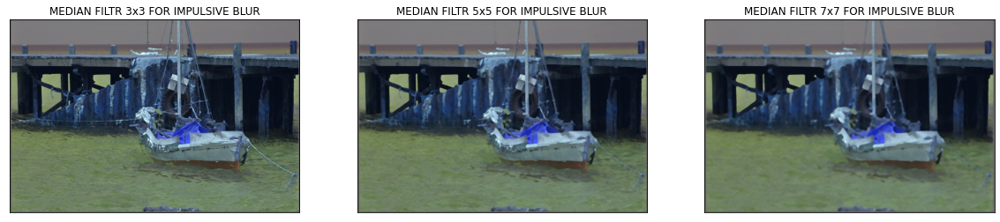

In [7]:
def plt_imshow(img_title, img):
  """ Function plots image (more comfort way than opencv function).
  
  Args:
    img_title (str): name of image
    img (numpy.ndarray): image to show
  """
  # plt.figure(figsize=(, 15))     # scalling to hall of cell
  plt.title(img_title)             # setting title
  plt.imshow(img, cmap="gray", vmin=0, vmax=255)  # ploting image
  plt.xticks([]), plt.yticks([])


plt.figure(figsize=(20, 20))
plt.subplot(431)
plt_imshow("GAUSSIAN FILTR 3x3 FOR GAUSSIAN BLUR", imageGaussGB3)
plt.subplot(432)
plt_imshow("GAUSSIAN FILTR 5x5 FOR GAUSSIAN BLUR", imageGaussGB5)
plt.subplot(433)
plt_imshow("GAUSSIAN FILTR 7x7 FOR GAUSSIAN BLUR", imageGaussGB7)
plt.subplot(434)
plt_imshow("GAUSSIAN FILTR 3x3 FOR IMPULSIVE BLUR", imageImpGB3)
plt.subplot(435)
plt_imshow("GAUSSIAN FILTR 5x5 FOR IMPULSIVE BLUR", imageImpGB5)
plt.subplot(436)
plt_imshow("GAUSSIAN FILTR 7x7 FOR IMPULSIVE BLUR", imageImpGB7)
plt.subplot(437)
plt_imshow("MEDIAN FILTR 3x3 FOR GAUSSIAN BLUR", imageGaussMed3)
plt.subplot(438)
plt_imshow("MEDIAN FILTR 5x5 FOR GAUSSIAN BLUR", imageGaussMed5)
plt.subplot(439)
plt_imshow("MEDIAN FILTR 7x7 FOR GAUSSIAN BLUR", imageGaussMed7)
plt.show()

plt.figure(figsize=(20, 20))
plt.subplot(131)
plt_imshow("MEDIAN FILTR 3x3 FOR IMPULSIVE BLUR", imageImpMed3)
plt.subplot(132)
plt_imshow("MEDIAN FILTR 5x5 FOR IMPULSIVE BLUR", imageImpMed5)
plt.subplot(133)
plt_imshow("MEDIAN FILTR 7x7 FOR IMPULSIVE BLUR", imageImpMed7)
plt.show()

+ WNIOSKI:
  + Wraz ze wzrostem maski, w każdym przypadku zauważyć można, że obraz staje się coraz bardziej rozmazany i niewyraźny (szczególnie w przypadku filtru medianowego), jednak szumy, które występowały w obrazie wejściowym, są coraz bardziej redukowane.
  + Można zauważyć, na podstawie powyższej tabelki, że mniejsza maska przekłada się na większą wartość PSNR. Wynika to głównie z faktu rozmazania - czym większe one jest, tym wartość PSNR maleje. Przy takim założeniu można by było uznać, że najlepiej obraz wygląda dla jak najmniejszych masek, jednak w jednym, konkretnym przypadku (porównania wyniku dla filtru gaussa z maskami 3x3 i 5x5 z szumem impulsowym) nie można się z tym zgodzić - w ramach mniejszej z masek uwidocznione są zdecydowanie bardziej szumy. Fakt ten pokazuje, że miara PSNR nie w każdym przypadku idealnie odzwierciedla ludzki system widzenia i jego subiektywność.
  + Istotne jest również zwrócenie uwagi na fakt, który filtr lepiej pasuje do danego rodzaju szumu. Zauważyć można, że dla obrazu z szumem impulsowym, filtr medianowy osiąga znacznie lepsze efekty i dla maski 3x3 praktycznie eliminuje szum z obrazka. Zupełnie odwrotna sytuacja występuje w przypadku obrazka z szumem gaussowskim - tutaj filtr gaussa radzi sobie zdecydowanie lepiej (szum jest w miarę podobnie zredukowany, jednak obraz po filtracji medianowej jest zdecydowanie bardziej zniekształcony niż po filtracji z użyciem filtru Gaussa).
  + Poprzedni wniosek za to też przejawia się w wyniku PSNR - w tabeli widać, że wyższe PSNR jest w przypadku obrazu z szumem impulsowym dla filtru medianowego, natomiast w przypadku obrazu z szumem gaussowskim - dla filtru gaussowskiego. W tym porównaniu można przyznać więc, że zgadza się ta miara z ludzkim systemem widzenia.

## 3. Zadanie 2 - wyrównanie histogramu
+  Na początku koniecznym było przekonwertowanie obrazu wejściowego do przestrzeni YcbCr.
+ Następnie na składowej luminancji (Y) wykonano wyrównanie histogramu, przekonwertowano obraz z powrotem do przestrzeni RGB i wyświetlono go.

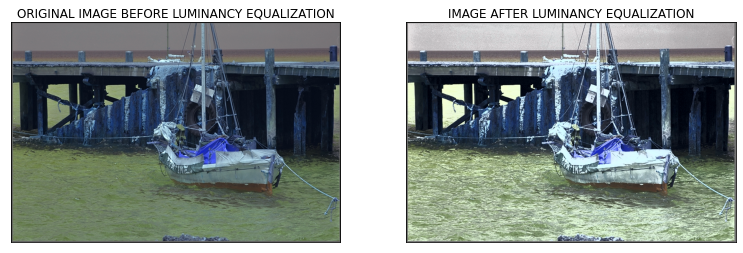

In [9]:
imageYCbCr = cv2.cvtColor(imageOrig, cv2.COLOR_BGR2YCR_CB)                 # original image in YCbCr
imageYCbCrEquY = np.zeros(imageYCbCr.shape, dtype=imageYCbCr.dtype)             
imageYCbCrEquY[:, :, 0] = cv2.equalizeHist(imageYCbCr[:, :, 0])                 # equalizing only for Y
imageYCbCrEquY[:, :, 1] = imageYCbCr[:, :, 1]
imageYCbCrEquY[:, :, 2] = imageYCbCr[:, :, 2]
imageEquRGB = cv2.cvtColor(imageYCbCrEquY, cv2.COLOR_YCR_CB2BGR)                # image converted back to RGB

plt.figure(figsize=(13, 13))
plt.subplot(121)
plt_imshow("ORIGINAL IMAGE BEFORE LUMINANCY EQUALIZATION", imageOrig)
plt.subplot(122)
plt_imshow("IMAGE AFTER LUMINANCY EQUALIZATION", imageEquRGB)
plt.show()

+ Następnie zostało wykonane zestawienie histogramów. Na początku porównane zostały ze sobą histogramy dla składowych chrominancyjnych. Ze względu na brak rozciągnięcia tych histogramów, nie powinny one były różnić się od siebie.

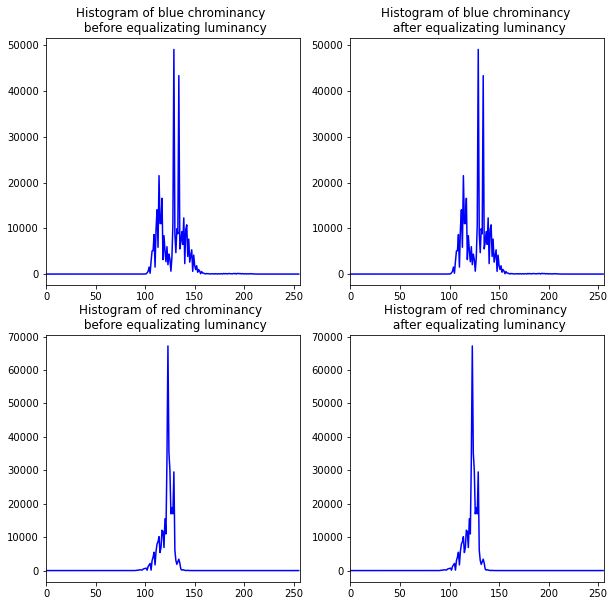

In [14]:
def plotHistComponent(image, componentIndex, title):
  """Function shows histogram of chosen component of image.
  
  Args:
    image (numpy.ndarray):  image to show component of
    componentIndex(): index of component
    title (): title of plot
  """
  # getting histogram and converting to 1D
  hist_cv = cv2.calcHist([image], [componentIndex], None, [256], [0, 256])
  hist_cv = hist_cv.flatten()
  
  # setting title
  plt.title(title)
  # ploting
  plt.plot(hist_cv, color="blue")
  plt.xlim([0, 256])

plt.figure(figsize=(10, 10))
plt.subplot(221)
plotHistComponent(imageYCbCr, 1, "Histogram of blue chrominancy \n before equalizating luminancy")
plt.subplot(222)
plotHistComponent(imageYCbCrEquY, 1, "Histogram of blue chrominancy \n after equalizating luminancy")
plt.subplot(223)
plotHistComponent(imageYCbCr, 2, "Histogram of red chrominancy \n before equalizating luminancy")
plt.subplot(224)
plotHistComponent(imageYCbCrEquY, 2, "Histogram of red chrominancy \n after equalizating luminancy")
plt.show()

+ Zgodnie z założeniami, histogramy dla chrominancji zarówno niebieskiej jak i czerwonej nie zmieniły się w wyniku rozszerzania składowej luminancji obrazu.
+ Następnie zostało wykonane porównanie histogramów składowych luminancji, tutaj z założenia powinny były pojawić się różnice.

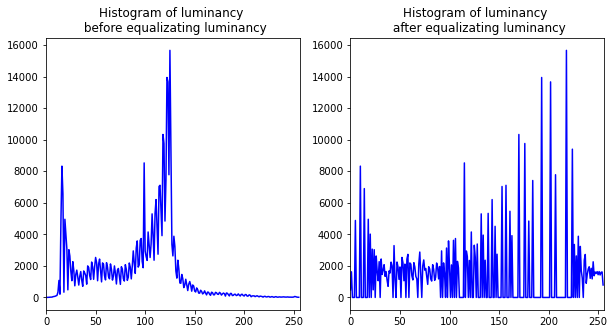

In [16]:
plt.figure(figsize=(10, 5))
plt.subplot(121)
plotHistComponent(imageYCbCr, 0, f"Histogram of luminancy \n before equalizating luminancy")
plt.subplot(122)
plotHistComponent(imageYCbCrEquY, 0, f"Histogram of luminancy \n after equalizating luminancy")
plt.show()

+ Na końcu wykonano jeszcze porównanie histogramów 3 składowych dla obrazów RGB przed i po wyrównaniu histogramu luminescencji.

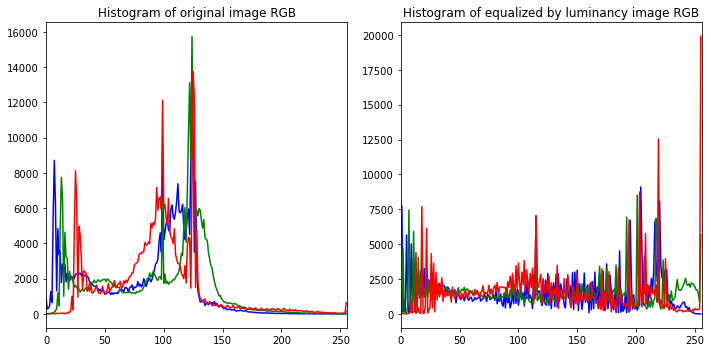

In [17]:
def plotHistogramRGB(title, imageRGB, ind):
  color = ('b','g','r')
  plt.title(title)
  for i,col in enumerate(color):
      histr = cv2.calcHist([imageRGB],[i],None,[256],[0,256])
      plt.plot(histr,color = col)
      plt.xlim([0,256])


plt.figure(figsize=(10, 5))
plt.subplot(121)
plotHistogramRGB("Histogram of original image RGB", imageOrig, 1)
plt.subplot(122)
plotHistogramRGB("Histogram of equalized by luminancy image RGB", imageEquRGB, 2)
plt.tight_layout()
plt.show()

+ WNIOSKI:
  + Zgodnie z wykresami i tym co zostało wykonane w programie, histogramy chrominancji (niebieskiej i czerwonej) nie uległy zmianie, ponieważ nie były wykonywane żadne operacje na tych składowych. Histogram dla luminancji natomiast odpowiednio został rozciągnięty na cały zakres możliwych wartości pikseli.
  + Jeśli chodzi o zmianę w histogramach dla składowych RGB, to tutaj zmiana dotyczy już wszystkich składowych - histogramy dla każdej z nich się rozszerzyły w wyniku rozszerzenia histogramu luminescencji obrazu w innej przestrzeni barw.
  + W przypadku obrazu można powiedzieć, że wyrównanie histogramu poprawiło jego kontrast, jednak nie widać tu znaczącego poprawienia jakości obrazu. Wyrównanie histogramu dla składowej luminancji wprowadziło do obrazu efekt, jakby promienie słoneczne zaczęły na dane miejsce padać. 

## 4. Zadanie 3 - wyostrzanie obrazu
+ Na początku istotnym było wygładzenie obrazów z szumem filtrem Gaussa w celu uniknięcia niepotrzebnego uwydatnienia szumu w wyostrzeniu.
+ Następnie wyznaczono obraz wysokoczęstotliwościowy z danych obrazów i wyświetlono go.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


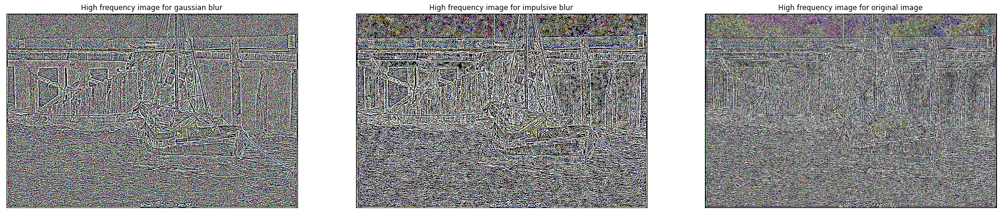

In [20]:
# reducting blur in blurred images
imageBlurGaussReducted = cv2.GaussianBlur(imageGauss, (3, 3), 0)
imageBlurImpulsiveReducted = cv2.GaussianBlur(imageImp, (3, 3), 0)
# getting high frequency images from images
imageHighFreqGauss = cv2.Laplacian(imageBlurGaussReducted, cv2.CV_64F)
imageHighFreqImp = cv2.Laplacian(imageBlurImpulsiveReducted, cv2.CV_64F)
imageHighFreqOrig = cv2.Laplacian(imageOrig, cv2.CV_64F)
# showing high frequency images

plt.figure(figsize=(30, 20))
plt.subplot(131)
plt_imshow("High frequency image for gaussian blur", imageHighFreqGauss)
plt.subplot(132)
plt_imshow("High frequency image for impulsive blur", imageHighFreqImp)
plt.subplot(133)
plt_imshow("High frequency image for original image", imageHighFreqOrig)
plt.show()

+ Ze względu na fakt, że krawędzie najlepiej są widoczne dla obrazka oryginalnego, to na nim zostało zbadane działanie różnych wartości wag na ostrzenie obrazu. 
+ Zostały przebadane wagi: $ -10, -3, -1, -0.4, 0.5, 3 $; a dla każdej z nich zostały przedstawione obrazy po wyostrzeniu z ich użyciem.

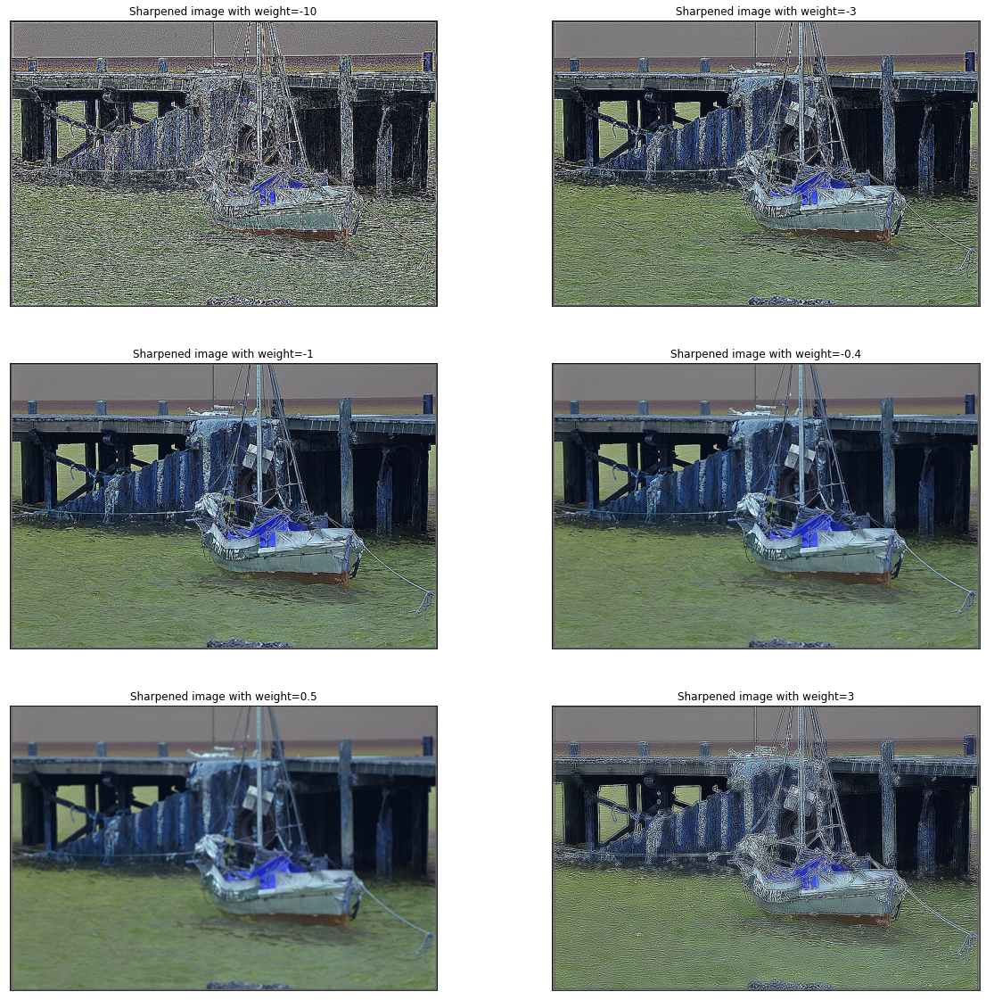

In [25]:
def sharpenImage(imageOrig, imageHighFreq, weight):
  """ Function sharpens given image with use of weight and high frequency form of such image.

  Args:
  imageOrig (numpy.ndarray): original image to sharpen
  imageHighFreq (numpy.ndarray): high frequency form of image
  weight (float): weight by which high frequency image is multiplying

  Returns:
  numpy.ndarray: sharpened image
  """
  return cv2.addWeighted(imageOrig, 1, imageHighFreq, weight, 0, dtype=cv2.CV_8U)

plt.figure(figsize=(20,20))
# to make images next to each other
subplots=(321, 322, 323, 324, 325, 326)
# for each weight get sharpened image and show it
for weight, sub in zip((-10, -3, -1, -0.4, 0.5, 3), subplots):
  plt.subplot(sub)
  sharpenedImage = sharpenImage(imageOrig, imageHighFreqOrig, weight)
  plt_imshow(f"Sharpened image with weight={weight}", sharpenedImage)
plt.show()

+ Następnie zostały przestawione różnice pomiędzy obrazkami, a ich wyostrzeniami przy założeniu $wagi = -1$, bo ta wydała się tworzącą obraz najprzyjemniejszy dla oka.

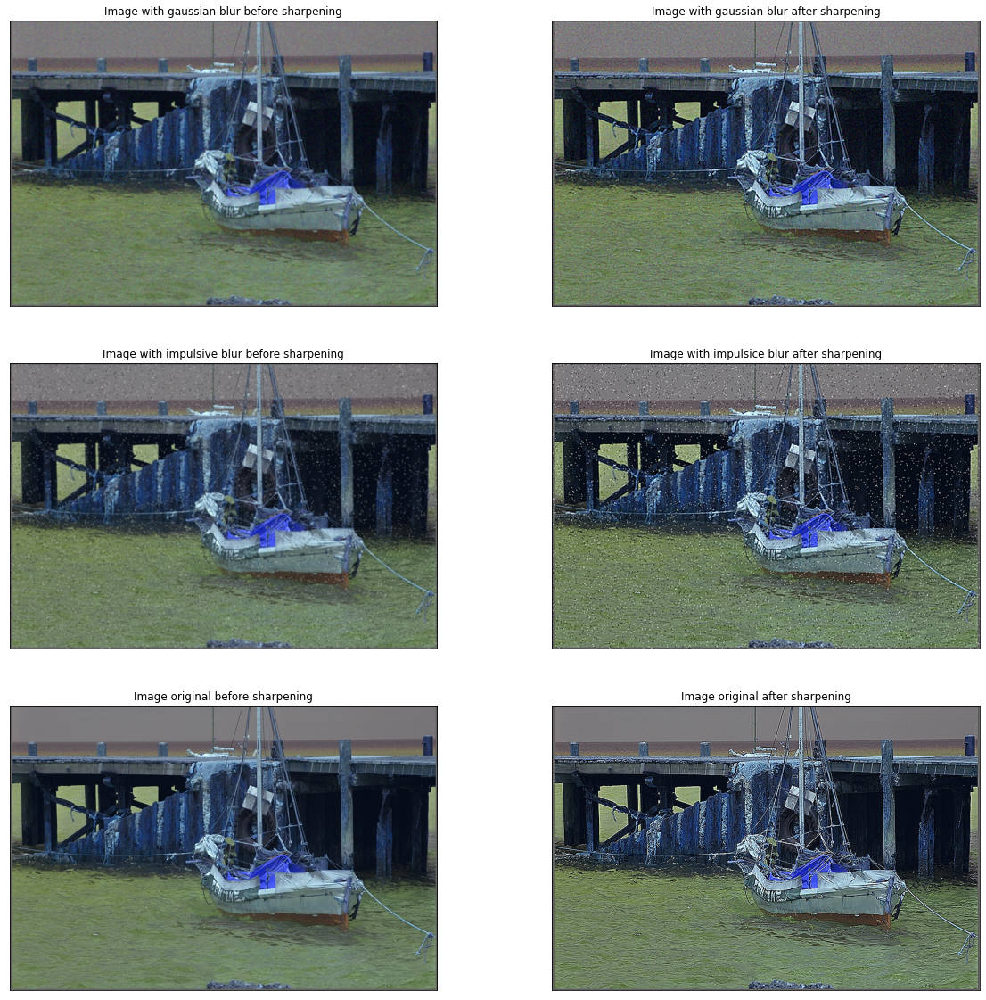

In [26]:
weight = -1
plt.figure(figsize=(20, 20))
plt.subplot(321)
plt_imshow("Image with gaussian blur before sharpening", imageBlurGaussReducted)
plt.subplot(322)
plt_imshow("Image with gaussian blur after sharpening", sharpenImage(imageBlurGaussReducted, imageHighFreqGauss, weight))
plt.subplot(323)
plt_imshow("Image with impulsive blur before sharpening", imageBlurImpulsiveReducted)
plt.subplot(324)
plt_imshow("Image with impulsice blur after sharpening", sharpenImage(imageBlurImpulsiveReducted, imageHighFreqImp, weight))
plt.subplot(325)
plt_imshow("Image original before sharpening", imageOrig)
plt.subplot(326)
plt_imshow("Image original after sharpening", sharpenImage(imageOrig, imageHighFreqOrig, weight))

+ Wnioski:
  + Zauważyć można, że wraz ze zwiększeniem się **co do modułu** wagi $W$ przy wyostrzaniu obrazów, krawędzie obrazu widać znacznie bardziej. W przypadku liczb ujemnych, krawędzie te uwydatniają się w kolorze czarnym, natomiast w przypadku dodatnich - w kolorze białym. Subiektywnie można uznać, że wyostrzanie czarnymi krawędziami jest zdecydowanie przyjemniejsze dla ludzkiego systemu widzenia, natomiast wyostrzanie kolorem białym (dodatnimi wagami) przynosi zupełnie odwrotny skutek - obraz staje się coraz bardziej niewyraźny i zniekształcony.
  + Jeśli chodzi o konkretne wartości wag, bardzo dobrze wypadają $ wagi \in <-1, 0) $, jednak najlepiej wypada $ waga = -1 $, a także $ waga = -0.4 $. Wraz ze zwiększeniem się wagi co do modułu, obraz jest coraz bardziej wyostrzany. W przypadku $ waga = -3 $, obraz dalej wygląda dobrze, jednak widać w nim krawędzie znacznie bardziej.
  + W przypadku wyostrzania obrazów zaszumionych, niezbędnym okazała się operacja odszumienia filtrem gaussa obrazów przed poddaniem ich wyostrzeniu. W efekcie otrzymane zostały obrazy, które zostały znacznie lepiej wyostrzone, a nie przełożyło się to bardzo na uwydatnienie szumu.
  + Skuteczność odszumienia w celu nieuwydatnienia szumu na obrazie pokazuje niżej zestawione porównanie, gdzie na lewo pokazano wynik wyostrzenia o $ wadze = -3 $ na obrazie z redukcją szumu wcześniej, a na prawo - wynik tego samego wyostrzenia, ale bez wcześniejszej redukcji szumu. 

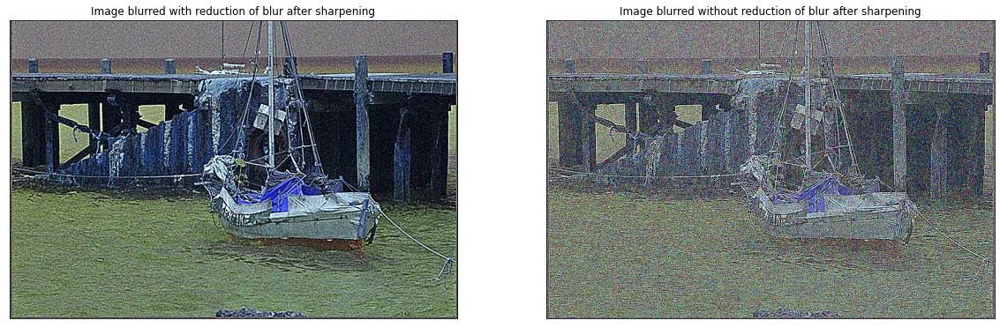

In [27]:
# getting high frequency images of recued and unreduced by blur images
imageHighFreqGaussReduc = cv2.Laplacian(imageBlurGaussReducted, cv2.CV_64F)
imageHighFreqGaussNoReduc = cv2.Laplacian(imageGauss, cv2.CV_64F)
weight = -3
# showing images
plt.figure(figsize=(20, 20))
plt.subplot(121)
plt_imshow("Image blurred with reduction of blur after sharpening", sharpenImage(imageBlurGaussReducted, imageHighFreqGaussReduc, weight))
plt.subplot(122)
plt_imshow("Image blurred without reduction of blur after sharpening", sharpenImage(imageGauss, imageHighFreqGaussNoReduc, weight))
plt.show()